In [113]:
import pandas as pd
import numpy as np
from bs4 import BeautifulSoup
import requests
import geocoder
import folium
import json
import matplotlib.pyplot as plt

# tranforming json file into a pandas dataframe library

from pandas.io.json import json_normalize

In [2]:
# Foursquare info
CLIENT_ID = 'YYOWXSCKI5FPXTVDNUYJK5J40GIEWDORSQY3LCUUH1FZALDZ' # your Foursquare ID
CLIENT_SECRET = '3J32IGNOAKSSQ2OEWOG0TQNVQT0ACPE3P1JINLRY1OHYXXES' # your Foursquare Secret
ACCESS_TOKEN = 'UQEC4Y3RYT2PSC25VQE1OMKOOTMCVHVLVLQ1EEZHXERWHJ2Z' # your FourSquare Access Token
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

### Get the data needed to conduct the analysis.
##### First, we'll get the income data by zip code.

In [3]:
income = 'https://www.laalmanac.com/employment/em12c.php'

r = requests.get(income)

zip_incomes = pd.read_html(r.text)
zip_income = zip_incomes[0]

In [4]:
zip_income.head()

,Zip Code,Community,Estimated Median Income
0,90001,"Los Angeles (South Los Angeles), Florence-Graham","$43,360"
1,90002,"Los Angeles (Southeast Los Angeles, Watts)","$37,285"
2,90003,"Los Angeles (South Los Angeles, Southeast Los ...","$40,598"
3,90004,"Los Angeles (Hancock Park, Rampart Village, Vi...","$49,675"
4,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire...","$38,491"


Based on info at https://file.lacounty.gov/SDSInter/dpss/1050803_CSBG_PovertyGuideliines2019_01-11-2019.pdf, we will use the federal poverty level (FPL) for a family of 4 as the benchmark for median income ($35,750)

In [74]:
fpl = 35750
zip_income.drop(zip_income[zip_income['Estimated Median Income'] == '---' ].index , inplace=True)
zip_income['Estimated Median Income'] = zip_income['Estimated Median Income'].replace('[\$\,\.]',"",regex=True).astype(int)
zip_income.head()

,Zip Code,Community,Estimated Median Income
0,90001,"Los Angeles (South Los Angeles), Florence-Graham",43360
1,90002,"Los Angeles (Southeast Los Angeles, Watts)",37285
2,90003,"Los Angeles (South Los Angeles, Southeast Los ...",40598
3,90004,"Los Angeles (Hancock Park, Rampart Village, Vi...",49675
4,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire...",38491


In [75]:
zip_income['Poverty Ratio'] = zip_income['Estimated Median Income']/fpl
zip_income.head()

,Zip Code,Community,Estimated Median Income,Poverty Ratio
0,90001,"Los Angeles (South Los Angeles), Florence-Graham",43360,1.212867
1,90002,"Los Angeles (Southeast Los Angeles, Watts)",37285,1.042937
2,90003,"Los Angeles (South Los Angeles, Southeast Los ...",40598,1.135608
3,90004,"Los Angeles (Hancock Park, Rampart Village, Vi...",49675,1.389510
4,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire...",38491,1.076671


In [5]:
# get all the zip codes for LA county and then assign them to a list as strings

zips = list(zip_income['Zip Code'].unique())
str_zips = [str(i) for i in zips]

In [89]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
norm_emi = scaler.fit_transform(zip_income['Estimated Median Income'].to_numpy().reshape(-1, 1))
norm_df = pd.DataFrame(norm_emi, columns=['Norm EMI'])
zip_income['Norm EMI'] = norm_df.squeeze()
zip_income.head()

,Zip Code,Community,Estimated Median Income,Poverty Ratio,Norm EMI
0,90001,"Los Angeles (South Los Angeles), Florence-Graham",43360,1.212867,0.115622
1,90002,"Los Angeles (Southeast Los Angeles, Watts)",37285,1.042937,0.083291
2,90003,"Los Angeles (South Los Angeles, Southeast Los ...",40598,1.135608,0.100923
3,90004,"Los Angeles (Hancock Park, Rampart Village, Vi...",49675,1.389510,0.149231
4,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire...",38491,1.076671,0.089709


##### Now pull the zip code boundaries for LA County via geojson

In [6]:
# load GeoJSON
with open(r'C:\Users\Steven\OneDrive\Documents\IBM Data Science\zip-code-tabulation-areas-2012.geojson', 'r') as jsonFile:
    data = json.load(jsonFile)
tmp = data
tmp

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'kind': 'ZIP Code Tabulation Area (2012)',
    'external_id': '90001',
    'name': '90001',
    'slug': '90001-zip-code-tabulation-area-2012',
    'set': '/1.0/boundary-set/zip-code-tabulation-areas-2012/',
    'metadata': {'AWATER10': 0,
     'CLASSFP10': 'B5',
     'ALAND10': 9071359,
     'INTPTLAT10': '+33.9740268',
     'FUNCSTAT10': 'S',
     'ZCTA5CE10': '90001',
     'MTFCC10': 'G6350',
     'GEOID10': '90001',
     'INTPTLON10': '-118.2495088'},
    'resource_uri': '/1.0/boundary/90001-zip-code-tabulation-area-2012/'},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[-118.265151, 33.970249],
       [-118.265166, 33.974735],
       [-118.262969, 33.974746],
       [-118.262981, 33.981836],
       [-118.265174, 33.981828],
       [-118.265185, 33.989227],
       [-118.256436, 33.989317],
       [-118.256436, 33.989498],
       [-118.241159, 33.989422],
       [-118.241126, 33.988174],

In [7]:
# remove ZIP codes not in our dataset
geozips = []
for i in range(len(tmp['features'])):
    if tmp['features'][i]['properties']['name'] in str_zips:
        geozips.append(tmp['features'][i])

# creating new JSON object
new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips

# save JSON object as updated-file
open(r"C:\Users\Steven\OneDrive\Documents\IBM Data Science\updated-file.json", "w").write(
    json.dumps(new_json, sort_keys=True, indent=4, separators=(',', ': '))
)

5454890

##### In this step we reach out to the Foursquare API to pull all grocery stores we can for LA county

In [8]:
with open(r"C:\Users\Steven\OneDrive\Documents\IBM Data Science\updated-file.json", 'r') as read_file:
    zip_coords = json.load(read_file)
    
zip_layout = zip_coords['features']

In [9]:
dataframe = pd.json_normalize(zip_layout)
dataframe.head()

,type,geometry.coordinates,geometry.type,properties.external_id,properties.kind,properties.metadata.ALAND10,properties.metadata.AWATER10,properties.metadata.CLASSFP10,properties.metadata.FUNCSTAT10,properties.metadata.GEOID10,properties.metadata.INTPTLAT10,properties.metadata.INTPTLON10,properties.metadata.MTFCC10,properties.metadata.ZCTA5CE10,properties.name,properties.resource_uri,properties.set,properties.slug
0,Feature,"[[[[-118.265151, 33.970249], [-118.265166, 33....",MultiPolygon,90001,ZIP Code Tabulation Area (2012),9071359,0,B5,S,90001,+33.9740268,-118.2495088,G6350,90001,90001,/1.0/boundary/90001-zip-code-tabulation-area-2...,/1.0/boundary-set/zip-code-tabulation-areas-2012/,90001-zip-code-tabulation-area-2012
1,Feature,"[[[[-118.23737, 33.958521], [-118.237366, 33.9...",MultiPolygon,90002,ZIP Code Tabulation Area (2012),7930684,0,B5,S,90002,+33.9490988,-118.2467371,G6350,90002,90002,/1.0/boundary/90002-zip-code-tabulation-area-2...,/1.0/boundary-set/zip-code-tabulation-areas-2012/,90002-zip-code-tabulation-area-2012
2,Feature,"[[[[-118.265174, 33.981828], [-118.262981, 33....",MultiPolygon,90003,ZIP Code Tabulation Area (2012),9197637,403,B5,S,90003,+33.9641307,-118.2727831,G6350,90003,90003,/1.0/boundary/90003-zip-code-tabulation-area-2...,/1.0/boundary-set/zip-code-tabulation-areas-2012/,90003-zip-code-tabulation-area-2012
3,Feature,"[[[[-118.311601, 34.068958], [-118.337734, 34....",MultiPolygon,90004,ZIP Code Tabulation Area (2012),7894525,0,B5,S,90004,+34.0761981,-118.3107225,G6350,90004,90004,/1.0/boundary/90004-zip-code-tabulation-area-2...,/1.0/boundary-set/zip-code-tabulation-areas-2012/,90004-zip-code-tabulation-area-2012
4,Feature,"[[[[-118.291638, 34.061793], [-118.289895, 34....",MultiPolygon,90005,ZIP Code Tabulation Area (2012),2807559,0,B5,S,90005,+34.0591634,-118.3068924,G6350,90005,90005,/1.0/boundary/90005-zip-code-tabulation-area-2...,/1.0/boundary-set/zip-code-tabulation-areas-2012/,90005-zip-code-tabulation-area-2012


In [10]:
#get only the data points we need for the query, which are zip, lat, and lon
#rename the columns

zip_latlong = dataframe[['properties.name', 'properties.metadata.INTPTLAT10', 'properties.metadata.INTPTLON10']]
zip_latlong.rename(columns = {'properties.name':'Zip Code', 'properties.metadata.INTPTLAT10': 'Latitude', 
                              'properties.metadata.INTPTLON10':'Longitude'}, inplace=True)
zip_latlong.head()

C:\Users\Steven\anaconda3\lib\site-packages\pandas\core\frame.py:4296: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


,Zip Code,Latitude,Longitude
0,90001,+33.9740268,-118.2495088
1,90002,+33.9490988,-118.2467371
2,90003,+33.9641307,-118.2727831
3,90004,+34.0761981,-118.3107225
4,90005,+34.0591634,-118.3068924


In [11]:
# ensure the two data frames are of the same length
print(len(zips) == len(zip_latlong))
print(len(zips))

True
282


In [12]:
# need to convert zip codes from integers to strings for dataframe merge
zip_income['Zip Code'] = zip_income['Zip Code'].astype(str)
zip_income.dtypes

Zip Code                   object
Community                  object
Estimated Median Income    object
dtype: object

In [13]:
# merge dataframes so we have income and central lat and lon for each zip code

zip_data = zip_income.merge(zip_latlong, how='inner')
zip_data.head()

,Zip Code,Community,Estimated Median Income,Latitude,Longitude
0,90001,"Los Angeles (South Los Angeles), Florence-Graham","$43,360",+33.9740268,-118.2495088
1,90002,"Los Angeles (Southeast Los Angeles, Watts)","$37,285",+33.9490988,-118.2467371
2,90003,"Los Angeles (South Los Angeles, Southeast Los ...","$40,598",+33.9641307,-118.2727831
3,90004,"Los Angeles (Hancock Park, Rampart Village, Vi...","$49,675",+34.0761981,-118.3107225
4,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire...","$38,491",+34.0591634,-118.3068924


In [14]:
zip_data['Latitude'] = zip_data['Latitude'].str.strip('+')
zip_data.head()

,Zip Code,Community,Estimated Median Income,Latitude,Longitude
0,90001,"Los Angeles (South Los Angeles), Florence-Graham","$43,360",33.9740268,-118.2495088
1,90002,"Los Angeles (Southeast Los Angeles, Watts)","$37,285",33.9490988,-118.2467371
2,90003,"Los Angeles (South Los Angeles, Southeast Los ...","$40,598",33.9641307,-118.2727831
3,90004,"Los Angeles (Hancock Park, Rampart Village, Vi...","$49,675",34.0761981,-118.3107225
4,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire...","$38,491",34.0591634,-118.3068924


In [15]:
la_pop = 'https://www.laalmanac.com/population/po03z.php'

pop_data = requests.get(la_pop)
zip_pop = pd.read_html(pop_data.text)
zip_pops = zip_pop[0]
zip_pops.head()

,Zip Code,Community / Communities,2019 (Estimates)*,2010,2000
,Zip Code,Community / Communities,2019 (Estimates)*,2010,2000
,Zip Code,Community / Communities,2019 (Estimates)*,2010,2000
,Zip Code,Community / Communities,2019 (Estimates)*,2010,2000
,Zip Code,Community / Communities,2019 (Estimates)*,2010,2000
,Zip Code,Community / Communities,2019 (Estimates)*,2010,2000
,Zip Code,Community / Communities,2019 (Estimates)*,2010,2000
,Zip Code,Community / Communities,2019 (Estimates)*,2010,2000
,Zip Code,Community / Communities,2019 (Estimates)*,2010,2000
,Zip Code,Community / Communities,2019 (Estimates)*,2010,2000
,Zip Code,Community / Communities,2019 (Estimates)*,2010,2000


In [16]:
zip_pops.columns = zip_pops.columns.map('_'.join)

In [17]:
zip_pops.columns.values[0] = "Zip Code"
zip_pops.columns.values[1] = "Community"
zip_pops.columns.values[3] = "2010 Population"
zip_pops.columns

Index(['Zip Code', 'Community',
       '2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*_2019 (Estimates)*',
       '2010 Population',
       '2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000_2000'],
      dtype='object')

In [18]:
zip_pops_2010 = zip_pops[["Zip Code", "Community", "2010 Population"]][1:]
zip_pops_2010.head()

,Zip Code,Community,2010 Population
1,90001,"Los Angeles (South Los Angeles), Florence-Graham",57110
2,90002,"Los Angeles (Southeast Los Angeles, Watts)",51223
3,90003,"Los Angeles (South Los Angeles, Southeast Los ...",66266
4,90004,"Los Angeles (Hancock Park, Rampart Village, Vi...",62180
5,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire...",37681


In [90]:
pop_scaler = MinMaxScaler()
norm_pop = scaler.fit_transform(zip_pops_2010['2010 Population'].to_numpy().reshape(-1, 1))
norm_pop_df = pd.DataFrame(norm_pop, columns=['Norm Pop'])
zip_pops_2010['Norm Pop'] = norm_pop_df.squeeze()
zip_pops_2010.head()

,Zip Code,Community,2010 Population,Norm Pop
1,90001,"Los Angeles (South Los Angeles), Florence-Graham",57110,0.485301
2,90002,"Los Angeles (Southeast Los Angeles, Watts)",51223,0.627822
3,90003,"Los Angeles (South Los Angeles, Southeast Los ...",66266,0.589110
4,90004,"Los Angeles (Hancock Park, Rampart Village, Vi...",62180,0.357000
5,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire...",37681,0.560735


##### Use the Foursquare API to pull all of the grocery stores within a 5000 meter radius of the center of each zip code. We may get some overlap in grocery stores here, but this should be covered by the zip code.

In [40]:
search_query = 'Grocery'
radius = 3000
LIMIT = 100
latitudes = zip_data['Latitude'][6]
longitudes = zip_data['Longitude'][6]
post_code = zip_data['Zip Code'][6]
print(post_code)

90007


In [53]:
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&oauth_token={}&v={}&query={}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            latitudes, 
            longitudes,
            ACCESS_TOKEN, 
            VERSION, 
            search_query, 
            radius, 
            LIMIT)

#test_result = requests.get(url).json()['response']['venues']
print(requests.get(url).json())

{'meta': {'code': 200, 'requestId': '60d6aaac8c1ee957bddeac29'}, 'notifications': [{'type': 'notificationTray', 'item': {'unreadCount': 0}}], 'response': {'venues': [{'id': '4c2cc57bae6820a1c2d61943', 'name': 'Asian Fastfood and Grocery', 'location': {'address': '1260 W 6th St', 'lat': 34.0553106609529, 'lng': -118.26563284527485, 'labeledLatLngs': [{'label': 'display', 'lat': 34.0553106609529, 'lng': -118.26563284527485}], 'distance': 3505, 'postalCode': '90017', 'cc': 'US', 'city': 'Los Angeles', 'state': 'CA', 'country': 'United States', 'formattedAddress': ['1260 W 6th St', 'Los Angeles, CA 90017']}, 'categories': [{'id': '4bf58dd8d48988d118951735', 'name': 'Grocery Store', 'pluralName': 'Grocery Stores', 'shortName': 'Grocery Store', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/food_grocery_', 'suffix': '.png'}, 'primary': True}], 'referralId': 'v-1624681132', 'hasPerk': False}, {'id': '4b66202df964a5201b152be3', 'name': 'A-Grocery Warehouse', 'location': {'add

In [48]:
def getNearbyVenues(names, latitudes, longitudes, radius=3000, search_query='Grocery', LIMIT=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name, lat, lng)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&oauth_token={}&v={}&query={}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            lat, 
            lng,
            ACCESS_TOKEN, 
            VERSION, 
            search_query, 
            radius, 
            LIMIT)
                       
        # make the GET request
        result = requests.get(url).json()
        #print(result)
        results = result['response']['venues']
        #print(results)
        # return only relevant information for each nearby venue
        if len(results) == 0:
            venues_list.append([name, lat, lng, '', '', '', ''])
        else:
            for res in results:
                if len(res['categories']) == 0:
                    venues_list.append([name, lat, lng, res['name'],
                                       res['location']['lat'], res['location']['lng'], ''])
                else:
                    venues_list.append([name, lat, lng,
                                         res['name'],
                                         res['location']['lat'], 
                                         res['location']['lng'], res['categories'][0]['name']])
                
            
        
    #nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    #nearby_venues.columns = ['Zip Code', 
    #            'Zip Code Latitude', 
    #            'Zip Code Longitude', 
    #            'Venue', 
    #            'Venue Latitude', 
    #            'Venue Longitude', 
    #            'Venue Category']
        

    #return(nearby_venues)
    return(venues_list)

In [54]:
la_grocery = getNearbyVenues(zip_data['Zip Code'], zip_data['Latitude'], zip_data['Longitude'])

90001 33.9740268 -118.2495088
90002 33.9490988 -118.2467371
90003 33.9641307 -118.2727831
90004 34.0761981 -118.3107225
90005 34.0591634 -118.3068924
90006 34.0480415 -118.2941770
90007 34.0281325 -118.2848282
90008 34.0095516 -118.3467240
90010 34.0621476 -118.3158894
90011 34.0070900 -118.2586805
90012 34.0659750 -118.2386415
90013 34.0454055 -118.2404535
90014 34.0431457 -118.2517464
90015 34.0393779 -118.2662996
90016 34.0283315 -118.3543375
90017 34.0529134 -118.2643397
90018 34.0288870 -118.3171834
90019 34.0498412 -118.3384601
90020 34.0663795 -118.3098700
90021 34.0290360 -118.2378702
90022 34.0237282 -118.1562745
90023 34.0225015 -118.1996129
90024 34.0657230 -118.4349693
90025 34.0454209 -118.4458730
90026 34.0800169 -118.2626427
90027 34.1271942 -118.2956469
90028 34.0999122 -118.3269118
90029 34.0898482 -118.2946605
90031 34.0857836 -118.2066664
90032 34.0781950 -118.1854971
90033 34.0503802 -118.2119912
90034 34.0305777 -118.3996127
90035 34.0518085 -118.3836742
90036 34.0

93544 34.4955373 -117.7566446
93550 34.4083832 -118.1235974
93551 34.6041103 -118.2390048
93552 34.5708668 -118.0237441
93553 34.4073297 -117.9118398
93563 34.4025215 -117.7660655
93591 34.5943971 -117.8136821


In [58]:
col_names = ['Zip Code', 'Zip Code Latitude', 'Zip Code Longitude', 
             'Store Name', 'Store Latitude', 'Store Longitude', 'Store Category']
la_groceries = pd.DataFrame(la_grocery, columns=col_names)
print(la_groceries.shape)
print(la_groceries.head(10))

(810, 7)
  Zip Code Zip Code Latitude Zip Code Longitude                  Store Name  \
0    90001        33.9740268       -118.2495088                               
1    90002        33.9490988       -118.2467371      Superior Grocery Store   
2    90002        33.9490988       -118.2467371       Harris Grocery Market   
3    90003        33.9641307       -118.2727831      Superior Grocery Store   
4    90003        33.9641307       -118.2727831            Superior Grocers   
5    90004        34.0761981       -118.3107225       Zeytun Grocery & Deli   
6    90004        34.0761981       -118.3107225      J & J Grocery & Liquor   
7    90004        34.0761981       -118.3107225  Santa Monica Grocery Store   
8    90004        34.0761981       -118.3107225               Sunny Grocery   
9    90005        34.0591634       -118.3068924               Sunny Grocery   

  Store Latitude Store Longitude     Store Category  
0                                                    
1        33.9

In [60]:
la_groceries['Store Category'].value_counts()

Grocery Store                    329
                                 113
Supermarket                      111
Deli / Bodega                     43
Food                              42
Liquor Store                      29
Indian Restaurant                 19
Convenience Store                 16
Market                            15
Big Box Store                     14
Salad Place                       11
Middle Eastern Restaurant          8
Gourmet Shop                       7
Cajun / Creole Restaurant          7
Vegetarian / Vegan Restaurant      6
Health Food Store                  5
Coffee Shop                        5
Building                           5
Food & Drink Shop                  4
Financial or Legal Service         4
Miscellaneous Shop                 4
Factory                            3
Snack Place                        3
Outlet Store                       3
Wine Bar                           3
Fast Food Restaurant               1
Name: Store Category, dtype: int64

Need to consider what to do here with the categories. Do we drop restaurants? Definitely need to drop all the blanks. Do we flag some categories as "Qualifying Store"?

Start cleansing the data by dropping categories that don't qualify as any type of food store. Then create flag column on "Qualifying Food Store" (e.g. not bodegas or convenience stores)

In [64]:
drop_list = ['', 'Liquor Store', 'Indian Restaurant', 'Middle Eastern Restaurant', 'Cajun / Creole Restaurant',
            'Vegetarian / Vegan Restaurant', 'Coffee Shop', 'Building', 'Financial or Legal Service',
            'Miscellaneous Shop', 'Factory', 'Outlet Store', 'Wine Bar', 'Fast Food Restaurant']
la_groceries = la_groceries[la_groceries['Store Category'].isin(drop_list) == False]
la_groceries['Store Category'].value_counts()

Grocery Store        329
Supermarket          111
Deli / Bodega         43
Food                  42
Convenience Store     16
Market                15
Big Box Store         14
Salad Place           11
Gourmet Shop           7
Health Food Store      5
Food & Drink Shop      4
Snack Place            3
Name: Store Category, dtype: int64

In [178]:
la_groceries.shape

(600, 8)

In [66]:
qualifier = ['Grocery Store', 'Supermarket', 'Food', 'Market', 'Big Box Store',
            'Salad Place', 'Gourmet Shop', 'Health Food Store']

In [68]:
la_groceries['Qualifying Food Store'] = np.where(la_groceries['Store Category'].isin(qualifier), 1, 0)
la_groceries.head()

,Zip Code,Zip Code Latitude,Zip Code Longitude,Store Name,Store Latitude,Store Longitude,Store Category,Qualifying Food Store
1,90002,33.9490988,-118.2467371,Superior Grocery Store,33.9434,-118.267,Grocery Store,1
2,90002,33.9490988,-118.2467371,Harris Grocery Market,33.939,-118.233,Convenience Store,0
3,90003,33.9641307,-118.2727831,Superior Grocery Store,33.9434,-118.267,Grocery Store,1
4,90003,33.9641307,-118.2727831,Superior Grocers,33.9576,-118.31,Grocery Store,1
5,90004,34.0761981,-118.3107225,Zeytun Grocery & Deli,34.0985,-118.302,Grocery Store,1


In [94]:
la_summary = la_groceries.groupby('Zip Code').count()
la_summary.reset_index(inplace=True)
la_summary.head()

,Zip Code,Zip Code Latitude,Zip Code Longitude,Store Name,Store Latitude,Store Longitude,Store Category,Qualifying Food Store
0,90002,2,2,2,2,2,2,2
1,90003,2,2,2,2,2,2,2
2,90004,4,4,4,4,4,4,4
3,90005,5,5,5,5,5,5,5
4,90006,5,5,5,5,5,5,5


In [77]:
# one hot encoding
la_onehot = pd.get_dummies(la_groceries[['Store Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
la_onehot['Zip Code'] = la_groceries['Zip Code'] 

# move neighborhood column to the first column
fixed_columns = [la_onehot.columns[-1]] + list(la_onehot.columns[:-1])
la_onehot = la_onehot[fixed_columns]

la_onehot.head()

,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket
1,90002,0,0,0,0,0,0,1,0,0,0,0,0
2,90002,0,1,0,0,0,0,0,0,0,0,0,0
3,90003,0,0,0,0,0,0,1,0,0,0,0,0
4,90003,0,0,0,0,0,0,1,0,0,0,0,0
5,90004,0,0,0,0,0,0,1,0,0,0,0,0


Create the grouped one-hot encoded dataframe and add back in the qualifying food store count per zip code

In [95]:
la_grouped = la_onehot.groupby('Zip Code').mean().reset_index()
la_grouped['Qualifying Food Store'] = la_summary['Qualifying Food Store']
la_grouped

,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket,Qualifying Food Store
0,90002,0.0,0.5,0.00,0.00,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2
1,90003,0.0,0.0,0.00,0.00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2
2,90004,0.0,0.0,0.25,0.25,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4
3,90005,0.0,0.0,0.20,0.00,0.0,0.0,0.6,0.0,0.0,0.0,0.0,0.2,5
4,90006,0.0,0.0,0.00,0.00,0.0,0.0,0.8,0.0,0.0,0.2,0.0,0.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208,91790,0.5,0.0,0.00,0.00,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2
209,91801,0.0,0.0,0.00,0.00,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2
210,91803,0.0,0.0,0.00,0.00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1
211,93534,0.5,0.0,0.00,0.00,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2


Now need to bring in the normalized variables for population and income. Then we need to run k-means, using the elbow method to determine optimal number of clusters. After that, plot clusters on a chloropleth map of the counties coded by  poverty level ratio.

In [100]:
pop_short = zip_pops_2010[['Zip Code', '2010 Population', 'Norm Pop']]
print(pop_short.shape)
pop_short.head()

(294, 3)


,Zip Code,2010 Population,Norm Pop
1,90001,57110,0.485301
2,90002,51223,0.627822
3,90003,66266,0.589110
4,90004,62180,0.357000
5,90005,37681,0.560735


In [101]:
income_short = zip_income[['Zip Code', 'Estimated Median Income', 'Poverty Ratio', 'Norm EMI']]
print(income_short.shape)
income_short.head()

(280, 4)


,Zip Code,Estimated Median Income,Poverty Ratio,Norm EMI
0,90001,43360,1.212867,0.115622
1,90002,37285,1.042937,0.083291
2,90003,40598,1.135608,0.100923
3,90004,49675,1.389510,0.149231
4,90005,38491,1.076671,0.089709


In [104]:
la_group_pop = pd.merge(la_grouped, pop_short, how='left', on='Zip Code')
print(la_group_pop.shape)
la_group_pop.head()

(213, 16)


,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket,Qualifying Food Store,2010 Population,Norm Pop
0,90002,0.0,0.5,0.00,0.00,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2,51223,0.627822
1,90003,0.0,0.0,0.00,0.00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2,66266,0.589110
2,90004,0.0,0.0,0.25,0.25,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4,62180,0.357000
3,90005,0.0,0.0,0.20,0.00,0.0,0.0,0.6,0.0,0.0,0.0,0.0,0.2,5,37681,0.560735
4,90006,0.0,0.0,0.00,0.00,0.0,0.0,0.8,0.0,0.0,0.2,0.0,0.0,5,59185,0.387687


In [105]:
la_group_all = pd.merge(la_group_pop, income_short, how='left', on='Zip Code')
print(la_group_all.shape)
la_group_all.head()

(213, 19)


,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket,Qualifying Food Store,2010 Population,Norm Pop,Estimated Median Income,Poverty Ratio,Norm EMI
0,90002,0.0,0.5,0.00,0.00,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2,51223,0.627822,37285.0,1.042937,0.083291
1,90003,0.0,0.0,0.00,0.00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2,66266,0.589110,40598.0,1.135608,0.100923
2,90004,0.0,0.0,0.25,0.25,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4,62180,0.357000,49675.0,1.389510,0.149231
3,90005,0.0,0.0,0.20,0.00,0.0,0.0,0.6,0.0,0.0,0.0,0.0,0.2,5,37681,0.560735,38491.0,1.076671,0.089709
4,90006,0.0,0.0,0.00,0.00,0.0,0.0,0.8,0.0,0.0,0.2,0.0,0.0,5,59185,0.387687,37072.0,1.036979,0.082157


In [110]:
pd.set_option("display.max_rows", None, "display.max_columns", None)
la_group_all.fillna(0, inplace=True)
la_group_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 213 entries, 0 to 212
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Zip Code                 213 non-null    object 
 1   Big Box Store            213 non-null    float64
 2   Convenience Store        213 non-null    float64
 3   Deli / Bodega            213 non-null    float64
 4   Food                     213 non-null    float64
 5   Food & Drink Shop        213 non-null    float64
 6   Gourmet Shop             213 non-null    float64
 7   Grocery Store            213 non-null    float64
 8   Health Food Store        213 non-null    float64
 9   Market                   213 non-null    float64
 10  Salad Place              213 non-null    float64
 11  Snack Place              213 non-null    float64
 12  Supermarket              213 non-null    float64
 13  Qualifying Food Store    213 non-null    int64  
 14  2010 Population          2

### Now work on the k-means clustering, including elbow plot to determine optimal cluster numbers

In [111]:
from sklearn.cluster import KMeans

la_group_cluster = la_group_all.drop('Zip Code', 1)
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=0)
    kmeanModel.fit(la_group_all)
    distortions.append(kmeanModel.inertia_)

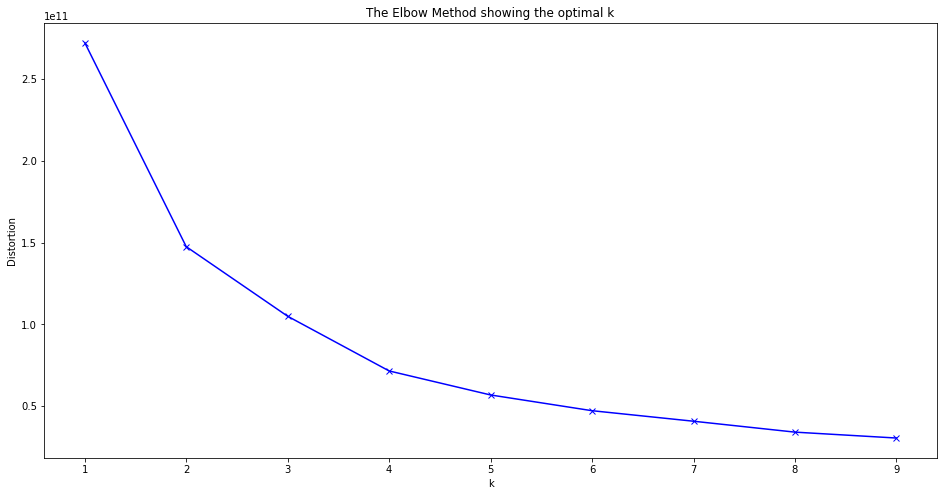

In [114]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

Evaluating the elbow plot, we are going to use 4 as our optimal number of clusters

In [115]:
# set number of clusters
kclusters = 4

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(la_group_cluster)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([2, 0, 0, 2, 0, 2, 2, 2, 0, 2])

In [116]:
len(kmeans.labels_)

213

In [118]:
la_group_all.insert(0, 'Cluster Label', kmeans.labels_)
la_group_all.head()

,Cluster Label,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket,Qualifying Food Store,2010 Population,Norm Pop,Estimated Median Income,Poverty Ratio,Norm EMI
0,2,90002,0.0,0.5,0.00,0.00,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,2,51223,0.627822,37285.0,1.042937,0.083291
1,0,90003,0.0,0.0,0.00,0.00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2,66266,0.589110,40598.0,1.135608,0.100923
2,0,90004,0.0,0.0,0.25,0.25,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4,62180,0.357000,49675.0,1.389510,0.149231
3,2,90005,0.0,0.0,0.20,0.00,0.0,0.0,0.6,0.0,0.0,0.0,0.0,0.2,5,37681,0.560735,38491.0,1.076671,0.089709
4,0,90006,0.0,0.0,0.00,0.00,0.0,0.0,0.8,0.0,0.0,0.2,0.0,0.0,5,59185,0.387687,37072.0,1.036979,0.082157


In [151]:
zip_data_short = zip_data[['Zip Code', 'Latitude', 'Longitude']]
la_cluster_zip = pd.merge(la_group_all, zip_data_short, how='left', on='Zip Code')
print(la_cluster_zip.shape)
la_cluster_zip

(213, 22)


,Cluster Label,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket,Qualifying Food Store,2010 Population,Norm Pop,Estimated Median Income,Poverty Ratio,Norm EMI,Latitude,Longitude
0,2,90002,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.500000,0.00,0.000000,0.000000,0.000000,0.000000,2,51223,0.627822,37285.0,1.042937,0.083291,33.9490988,-118.2467371
1,0,90003,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.00,0.000000,0.000000,0.000000,0.000000,2,66266,0.589110,40598.0,1.135608,0.100923,33.9641307,-118.2727831
2,0,90004,0.000000,0.000000,0.250000,0.250000,0.000000,0.000000,0.500000,0.00,0.000000,0.000000,0.000000,0.000000,4,62180,0.357000,49675.0,1.389510,0.149231,34.0761981,-118.3107225
3,2,90005,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.600000,0.00,0.000000,0.000000,0.000000,0.200000,5,37681,0.560735,38491.0,1.076671,0.089709,34.0591634,-118.3068924
4,0,90006,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.800000,0.00,0.000000,0.200000,0.000000,0.000000,5,59185,0.387687,37072.0,1.036979,0.082157,34.0480415,-118.2941770
5,2,90007,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.750000,0.00,0.000000,0.250000,0.000000,0.000000,4,40920,0.306275,27406.0,0.766601,0.030714,34.0281325,-118.2848282
6,2,90008,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,1,32327,0.036002,43364.0,1.212979,0.115644,34.0095516,-118.3467240
7,2,90010,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.400000,0.00,0.000000,0.000000,0.000000,0.400000,5,3800,0.984301,63112.0,1.765371,0.220744,34.0621476,-118.3158894
8,0,90011,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,1,103892,0.294678,40940.0,1.145175,0.102743,34.0070900,-118.2586805
9,2,90012,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.666667,0.00,0.000000,0.333333,0.000000,0.000000,3,31103,0.111531,47027.0,1.315441,0.135139,34.0659750,-118.2386415


### Create the folium choropleth maps based on cluster, income, and population

In [157]:
# reading of the updated GeoJSON file
la_geo = r'C:\Users\Steven\OneDrive\Documents\IBM Data Science\updated-file.json'
# initiating a Folium map with LA's longitude and latitude
m = folium.Map(location = [34.0522, -118.2437], zoom_start = 10)
# creating a choropleth map
folium.Choropleth(
    geo_data = la_geo,
    fill_opacity = 0.6,
    line_opacity = 0.2,
    data = la_group_all,
    # refers to which key within the GeoJSON to map the ZIP code to
    key_on = 'feature.properties.name',
    # first element contains location information, second element contains feature of interest
    columns = ['Zip Code', 'Estimated Median Income'],
    fill_color = 'YlGn',
    nan_fill_color = None,
    legend_name = 'Estimated Median Income'
).add_to(m)

marker_colors = ['#e41a1c', '#377eb8', '#984ea3', '#ff7f00']

for row in la_cluster_zip.itertuples():
    folium.Circle(location = [row.Latitude, row.Longitude],
                 radius = (5),    
                 color = marker_colors[int(row._1)],
                 fill = True,
                 fill_color = marker_colors[int(row._1)],
                 fill_opacity=0.8,
                 popup = 'Cluster ' + str(row._1)).add_to(m)
    
folium.LayerControl().add_to(m)
# save map with filename based on the feature of interest
m

### Evaluate each cluster to look at grocery store and mean income

In [169]:
cluster_1 = la_cluster_zip[la_cluster_zip['Cluster Label'] == 0]
print(cluster_1.shape)
print('Cluster 1 qualifying food stores per zip code {}'.format(cluster_1['Qualifying Food Store'].mean()))
print('Cluster 1 mean population per zip code {}'.format(cluster_1['2010 Population'].mean()))
print('Cluster 1 mean income per zip code {}'.format(cluster_1['Estimated Median Income'].mean()))
print('Cluster 1 mean poverty ratio per zip code {}'.format(cluster_1['Poverty Ratio'].mean()))                                                               
cluster_1.head()

(33, 22)
Cluster 1 qualifying food stores per zip code 2.484848484848485
Cluster 1 mean population per zip code 72415.57575757576
Cluster 1 mean income per zip code 54823.969696969696
Cluster 1 mean poverty ratio per zip code 1.5335376139012504


,Cluster Label,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket,Qualifying Food Store,2010 Population,Norm Pop,Estimated Median Income,Poverty Ratio,Norm EMI,Latitude,Longitude
1,0,90003,0.0,0.0,0.00,0.00,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2,66266,0.589110,40598.0,1.135608,0.100923,33.9641307,-118.2727831
2,0,90004,0.0,0.0,0.25,0.25,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4,62180,0.357000,49675.0,1.389510,0.149231,34.0761981,-118.3107225
4,0,90006,0.0,0.0,0.00,0.00,0.0,0.0,0.8,0.0,0.0,0.2,0.0,0.0,5,59185,0.387687,37072.0,1.036979,0.082157,34.0480415,-118.2941770
8,0,90011,0.0,0.0,0.00,1.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,103892,0.294678,40940.0,1.145175,0.102743,34.0070900,-118.2586805
16,0,90019,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2,64458,0.369184,56389.0,1.577315,0.184964,34.0498412,-118.3384601


In [174]:
cluster_1_sorted = cluster_1.sort_values(by=['Qualifying Food Store', 'Estimated Median Income', '2010 Population'],
                                        ascending=[True, True, False])
cluster_1_sorted.head()

,Cluster Label,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket,Qualifying Food Store,2010 Population,Norm Pop,Estimated Median Income,Poverty Ratio,Norm EMI,Latitude,Longitude
31,0,90037,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,62276,0.273968,35424.0,0.990881,0.073386,34.0027226,-118.2874866
8,0,90011,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,103892,0.294678,40940.0,1.145175,0.102743,34.0070900,-118.2586805
70,0,90255,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,75066,0.330879,44962.0,1.257678,0.124148,33.9792475,-118.2174380
19,0,90022,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,67179,0.434898,46051.0,1.288140,0.129944,34.0237282,-118.1562745
59,0,90221,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,53704,0.301936,51377.0,1.437119,0.158290,33.8856241,-118.2059184


In [168]:
cluster_2 = la_cluster_zip[la_cluster_zip['Cluster Label'] == 1]
print(cluster_2.shape)
print('Cluster 2 qualifying food stores per zip code {}'.format(cluster_2['Qualifying Food Store'].mean()))
print('Cluster 2 mean population per zip code {}'.format(cluster_2['2010 Population'].mean()))
print('Cluster 2 mean income per zip code {}'.format(cluster_2['Estimated Median Income'].mean()))
print('Cluster 2 mean poverty ratio per zip code {}'.format(cluster_2['Poverty Ratio'].mean()))
cluster_2.head()

(84, 22)
Cluster 2 qualifying food stores per zip code 2.9761904761904763
Cluster 2 mean population per zip code 28181.333333333332
Cluster 2 mean income per zip code 92273.28571428571
Cluster 2 mean poverty ratio per zip code 2.5810709290709277


,Cluster Label,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket,Qualifying Food Store,2010 Population,Norm Pop,Estimated Median Income,Poverty Ratio,Norm EMI,Latitude,Longitude
21,1,90025,0.0,0.0,0.0,0.00,0.0,0.142857,0.00,0.0,0.142857,0.0,0.0,0.714286,7,42147,0.643009,87280.0,2.441399,0.349369,34.0454209,-118.4458730
29,1,90035,0.0,0.0,0.0,0.00,0.0,0.000000,0.00,0.0,0.000000,0.0,0.0,1.000000,2,28418,0.349269,89337.0,2.498937,0.360316,34.0518085,-118.3836742
30,1,90036,0.0,0.0,0.2,0.00,0.0,0.000000,0.20,0.0,0.000000,0.0,0.0,0.600000,5,36865,0.590020,80539.0,2.252839,0.313493,34.0704102,-118.3504105
33,1,90039,0.0,0.0,0.5,0.25,0.0,0.000000,0.25,0.0,0.000000,0.0,0.0,0.000000,4,28514,0.118618,90538.0,2.532531,0.366708,34.1115246,-118.2605522
34,1,90041,0.0,0.0,0.0,0.00,0.0,0.000000,1.00,0.0,0.000000,0.0,0.0,0.000000,2,27425,0.591479,85971.0,2.404783,0.342402,34.1374122,-118.2076072


In [175]:
cluster_2_sorted = cluster_2.sort_values(by=['Qualifying Food Store', 'Estimated Median Income', '2010 Population'],
                                        ascending=[True, True, False])
cluster_2_sorted.head()

,Cluster Label,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket,Qualifying Food Store,2010 Population,Norm Pop,Estimated Median Income,Poverty Ratio,Norm EMI,Latitude,Longitude
93,1,90502,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,18010,0.420497,73826.0,2.065063,0.277765,33.8331813,-118.2920619
99,1,90604,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,39407,0.382107,74944.0,2.096336,0.283715,33.9297044,-118.0120801
167,1,91345,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,18496,0.315948,77273.0,2.161483,0.511304,34.2658781,-118.4572406
100,1,90605,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,40331,0.306929,78297.0,2.190126,0.301560,33.9502951,-118.0243515
123,1,90807,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,31481,0.362220,78948.0,2.208336,0.305025,33.8277403,-118.1748198


In [170]:
cluster_3 = la_cluster_zip[la_cluster_zip['Cluster Label'] == 2]
print(cluster_3.shape)
print('Cluster 3 qualifying food stores per zip code {}'.format(cluster_3['Qualifying Food Store'].mean()))
print('Cluster 3 mean population per zip code {}'.format(cluster_3['2010 Population'].mean()))
print('Cluster 3 mean income per zip code {}'.format(cluster_3['Estimated Median Income'].mean()))
print('Cluster 3 mean poverty ratio per zip code {}'.format(cluster_3['Poverty Ratio'].mean()))
cluster_3.head()

(84, 22)
Cluster 3 qualifying food stores per zip code 2.9285714285714284
Cluster 3 mean population per zip code 31737.89285714286
Cluster 3 mean income per zip code 53729.32142857143
Cluster 3 mean poverty ratio per zip code 1.5029180819180818


,Cluster Label,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket,Qualifying Food Store,2010 Population,Norm Pop,Estimated Median Income,Poverty Ratio,Norm EMI,Latitude,Longitude
0,2,90002,0.0,0.5,0.0,0.0,0.0,0.0,0.50,0.0,0.0,0.00,0.0,0.0,2,51223,0.627822,37285.0,1.042937,0.083291,33.9490988,-118.2467371
3,2,90005,0.0,0.0,0.2,0.0,0.0,0.0,0.60,0.0,0.0,0.00,0.0,0.2,5,37681,0.560735,38491.0,1.076671,0.089709,34.0591634,-118.3068924
5,2,90007,0.0,0.0,0.0,0.0,0.0,0.0,0.75,0.0,0.0,0.25,0.0,0.0,4,40920,0.306275,27406.0,0.766601,0.030714,34.0281325,-118.2848282
6,2,90008,0.0,0.0,0.0,1.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.0,1,32327,0.036002,43364.0,1.212979,0.115644,34.0095516,-118.3467240
7,2,90010,0.0,0.0,0.2,0.0,0.0,0.0,0.40,0.0,0.0,0.00,0.0,0.4,5,3800,0.984301,63112.0,1.765371,0.220744,34.0621476,-118.3158894


In [176]:
cluster_3_sorted = cluster_3.sort_values(by=['Qualifying Food Store', 'Estimated Median Income', '2010 Population'],
                                        ascending=[True, True, False])
cluster_3_sorted.head()

,Cluster Label,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket,Qualifying Food Store,2010 Population,Norm Pop,Estimated Median Income,Poverty Ratio,Norm EMI,Latitude,Longitude
139,2,91046,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,156,0.193844,0.0,0.000000,0.000000,34.2114521,-118.2410355
44,2,90058,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,3223,0.387990,21964.0,0.614378,0.001751,34.0028436,-118.2163997
195,2,91731,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,29591,0.581588,42293.0,1.183021,0.157710,34.0785730,-118.0434556
6,2,90008,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,32327,0.036002,43364.0,1.212979,0.115644,34.0095516,-118.3467240
74,2,90270,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,27372,0.217776,44124.0,1.234238,0.119689,33.9877293,-118.1865973


In [172]:
cluster_4 = la_cluster_zip[la_cluster_zip['Cluster Label'] == 3]
print(cluster_4.shape)
print('Cluster 4 qualifying food stores per zip code {}'.format(cluster_4['Qualifying Food Store'].mean()))
print('Cluster 4 mean population per zip code {}'.format(cluster_4['2010 Population'].mean()))
print('Cluster 4 mean income per zip code {}'.format(cluster_4['Estimated Median Income'].mean()))
print('Cluster 4 mean poverty ratio per zip code {}'.format(cluster_4['Poverty Ratio'].mean()))
cluster_4

(12, 22)
Cluster 4 qualifying food stores per zip code 1.8333333333333333
Cluster 4 mean population per zip code 18973.75
Cluster 4 mean income per zip code 151553.83333333334
Cluster 4 mean poverty ratio per zip code 4.239268065268065


,Cluster Label,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket,Qualifying Food Store,2010 Population,Norm Pop,Estimated Median Income,Poverty Ratio,Norm EMI,Latitude,Longitude
54,3,90094,0.0,0.0,0.000000,0.00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.000000,1,5464,0.000028,155417.0,4.347329,0.712000,33.9754143,-118.4169901
69,3,90254,0.0,0.0,0.333333,0.00,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.333333,3,19506,0.711196,136702.0,3.823832,0.612397,33.8642586,-118.3993032
73,3,90266,0.0,0.0,0.333333,0.00,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.333333,3,35135,0.259330,153023.0,4.280364,0.699259,33.8891508,-118.4021267
75,3,90274,0.0,0.0,0.000000,0.00,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,1.000000,1,25209,0.396062,169919.0,4.752979,0.789181,33.7800649,-118.3724543
76,3,90275,0.0,0.0,0.000000,0.00,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,1.000000,1,41804,0.334376,138293.0,3.868336,0.620865,33.7531460,-118.3674589
88,3,90402,0.0,0.0,0.000000,0.00,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.666667,3,12250,0.232357,154583.0,4.324000,0.707562,34.0346660,-118.5040391
134,3,91011,0.0,0.0,0.000000,0.00,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,1.000000,2,20280,0.384637,175652.0,4.913343,0.819693,34.2222614,-118.2053687
143,3,91105,0.0,0.0,0.000000,0.00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.000000,1,11254,0.229552,131158.0,3.668755,0.322391,34.1394598,-118.1666485
146,3,91108,0.0,0.0,0.000000,0.00,1.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,1,13361,0.215833,165765.0,4.636783,0.204720,34.1226714,-118.1129107
154,3,91210,0.0,0.0,0.500000,0.25,0.0,0.0,0.250000,0.0,0.0,0.0,0.0,0.000000,4,328,0.287601,135741.0,3.796951,0.443575,34.1445574,-118.2565070


In [177]:
cluster_4_sorted = cluster_4.sort_values(by=['Qualifying Food Store', 'Estimated Median Income', '2010 Population'],
                                        ascending=[True, True, False])
cluster_4_sorted.head()

,Cluster Label,Zip Code,Big Box Store,Convenience Store,Deli / Bodega,Food,Food & Drink Shop,Gourmet Shop,Grocery Store,Health Food Store,Market,Salad Place,Snack Place,Supermarket,Qualifying Food Store,2010 Population,Norm Pop,Estimated Median Income,Poverty Ratio,Norm EMI,Latitude,Longitude
170,3,91354,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,28722,0.308909,128308.0,3.589035,0.394160,34.4657549,-118.5537886
143,3,91105,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,11254,0.229552,131158.0,3.668755,0.322391,34.1394598,-118.1666485
76,3,90275,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,41804,0.334376,138293.0,3.868336,0.620865,33.7531460,-118.3674589
54,3,90094,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,5464,0.000028,155417.0,4.347329,0.712000,33.9754143,-118.4169901
146,3,91108,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,13361,0.215833,165765.0,4.636783,0.204720,34.1226714,-118.1129107
